# Naive Bayes

# 1) Prepare a classification model using Naive Bayes for salary data

In [7]:
#Import Libraries
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer

from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings("ignore")


In [8]:
Data1 = pd.read_csv('SalaryData_Test.csv', encoding="latin-1")

In [9]:
Data2 = pd.read_csv('SalaryData_Train.csv', encoding="latin-1")

In [10]:
Data1

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,0,0,40,United-States,<=50K
15056,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K
15057,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
15058,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K


EDA

In [11]:
Data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15060 entries, 0 to 15059
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            15060 non-null  int64 
 1   workclass      15060 non-null  object
 2   education      15060 non-null  object
 3   educationno    15060 non-null  int64 
 4   maritalstatus  15060 non-null  object
 5   occupation     15060 non-null  object
 6   relationship   15060 non-null  object
 7   race           15060 non-null  object
 8   sex            15060 non-null  object
 9   capitalgain    15060 non-null  int64 
 10  capitalloss    15060 non-null  int64 
 11  hoursperweek   15060 non-null  int64 
 12  native         15060 non-null  object
 13  Salary         15060 non-null  object
dtypes: int64(5), object(9)
memory usage: 1.6+ MB


In [12]:
Data1.describe()

,age,educationno,capitalgain,capitalloss,hoursperweek
count,15060.000000,15060.000000,15060.000000,15060.000000,15060.000000
mean,38.768327,10.112749,1120.301594,89.041899,40.951594
std,13.380676,2.558727,7703.181842,406.283245,12.062831
min,17.000000,1.000000,0.000000,0.000000,1.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000
75%,48.000000,13.000000,0.000000,0.000000,45.000000
max,90.000000,16.000000,99999.000000,3770.000000,99.000000


In [13]:
Data1.dtypes

age               int64
workclass        object
education        object
educationno       int64
maritalstatus    object
occupation       object
relationship     object
race             object
sex              object
capitalgain       int64
capitalloss       int64
hoursperweek      int64
native           object
Salary           object
dtype: object

In [14]:
Data1.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

In [15]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
Data1['workclass']= label_encoder.fit_transform(Data1['workclass'])
Data1['education']= label_encoder.fit_transform(Data1['education'])
Data1['maritalstatus']= label_encoder.fit_transform(Data1['maritalstatus'])
Data1['occupation']= label_encoder.fit_transform(Data1['occupation'])
Data1['relationship']= label_encoder.fit_transform(Data1['relationship'])
Data1['race']= label_encoder.fit_transform(Data1['race'])
Data1['sex']= label_encoder.fit_transform(Data1['sex'])
Data1['native']= label_encoder.fit_transform(Data1['native'])
Data1['Salary']= label_encoder.fit_transform(Data1['Salary'])

In [16]:
Data1

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0,0,40,37,0
1,38,2,11,9,2,4,0,4,1,0,0,50,37,0
2,28,1,7,12,2,10,0,4,1,0,0,40,37,1
3,44,2,15,10,2,6,0,2,1,7688,0,40,37,1
4,34,2,0,6,4,7,1,4,1,0,0,30,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,2,9,13,4,9,3,4,1,0,0,40,37,0
15056,39,2,9,13,0,9,1,4,0,0,0,36,37,0
15057,38,2,9,13,2,9,0,4,1,0,0,50,37,0
15058,44,2,9,13,0,0,3,1,1,5455,0,40,37,0


In [17]:
Data1.duplicated().value_counts()

False    14130
True       930
dtype: int64

(array([2439., 2647., 2943., 2886., 1906., 1197.,  722.,  220.,   78.,
          22.]),
 array([17. , 24.3, 31.6, 38.9, 46.2, 53.5, 60.8, 68.1, 75.4, 82.7, 90. ]),
 <BarContainer object of 10 artists>)

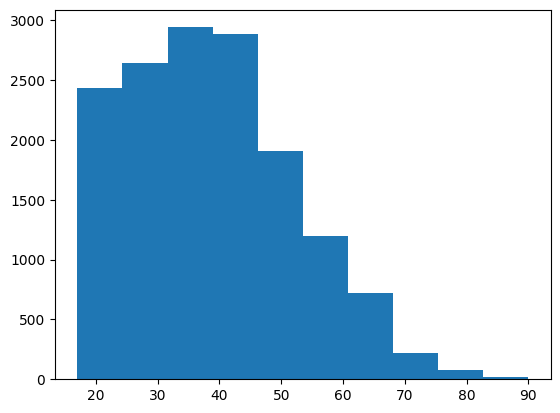

In [18]:
plt.hist(Data1['age'])

<Axes: xlabel='age', ylabel='educationno'>

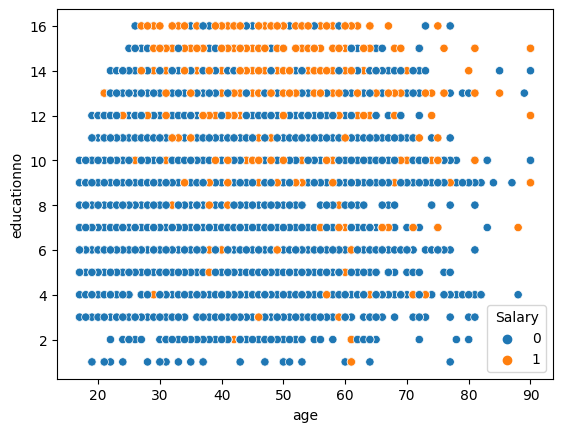

In [19]:
sns.scatterplot(x='age',y='educationno',data=Data1,hue='Salary')

<Axes: xlabel='workclass', ylabel='count'>

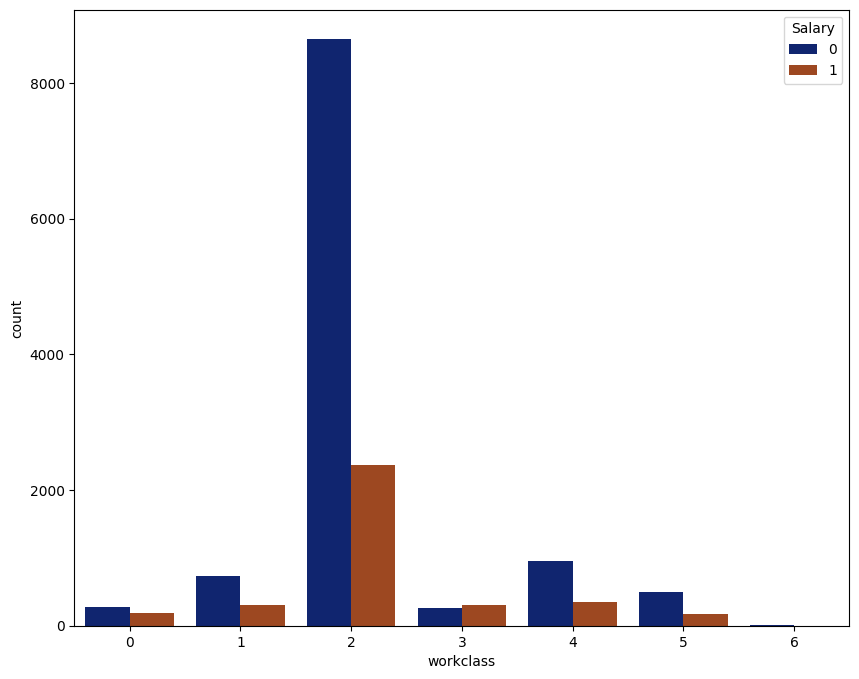

In [20]:
plt.figure(figsize=(10,8))
sns.countplot(x='workclass',hue='Salary',data=Data1,palette='dark')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13')])

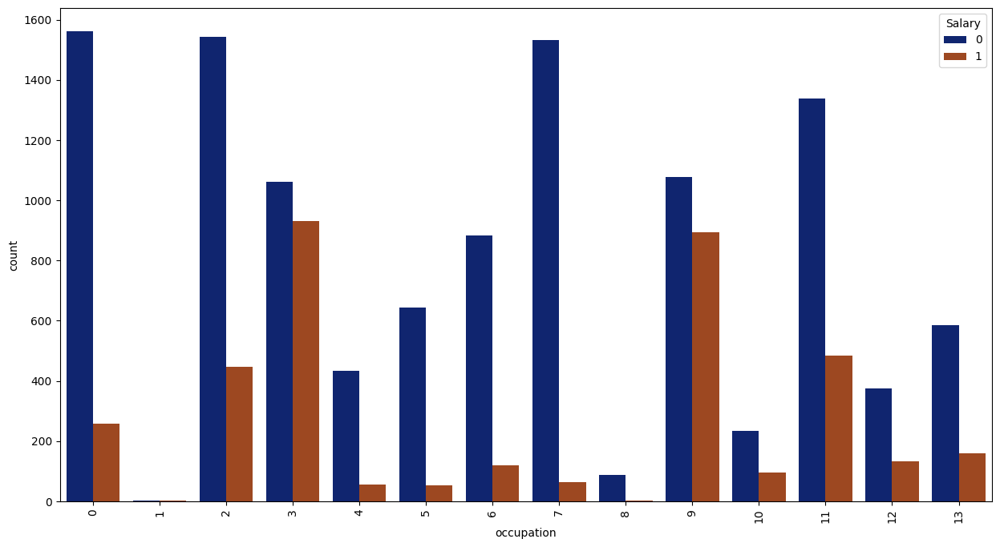

In [21]:
plt.figure(figsize=(15,8))
sns.countplot(x='occupation',hue='Salary',data=Data1,palette='dark')
plt.xticks( rotation ='vertical')

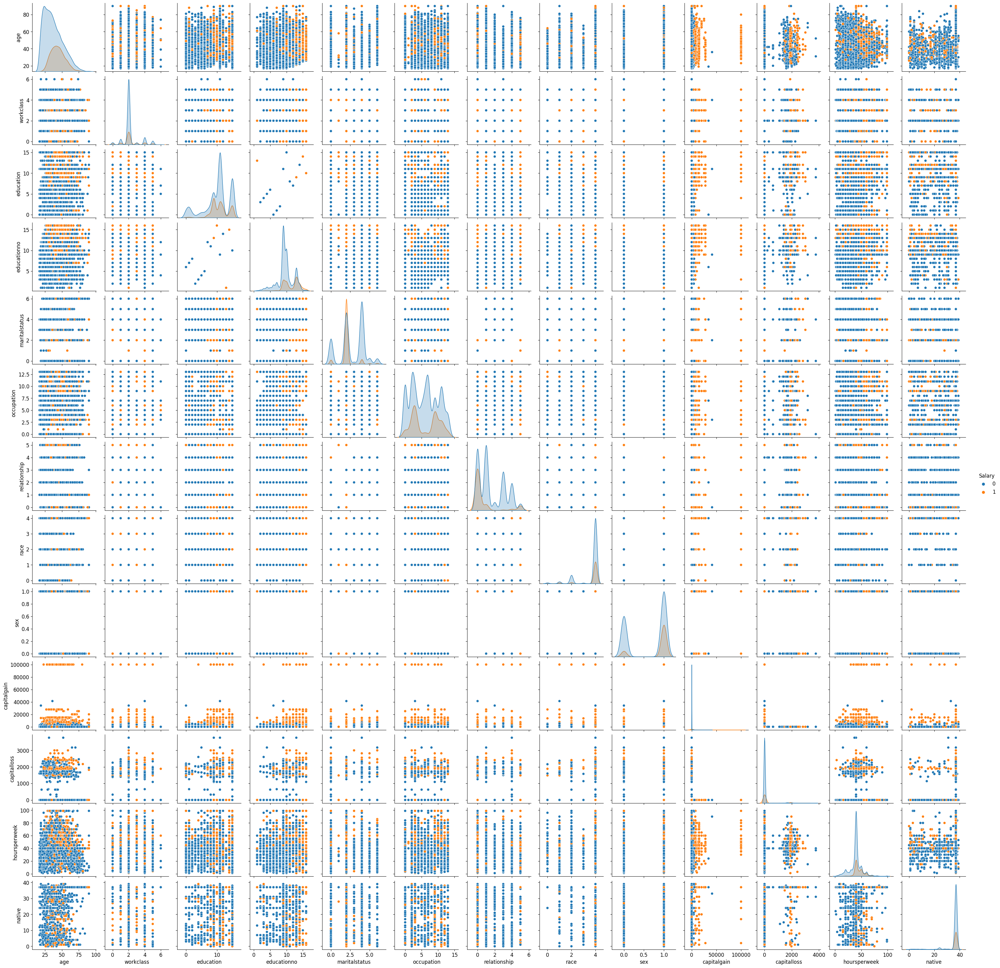

In [54]:
sns.pairplot(Data1,hue="Salary")

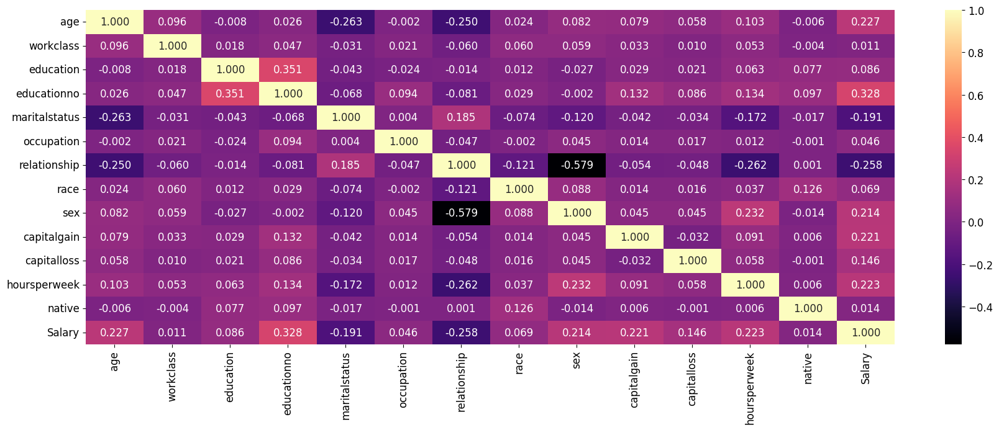

In [53]:
plt.figure(figsize = (21, 7));
sns.heatmap(Data1.corr(), cmap='magma', annot=True, fmt=".3f")
plt.show()

In [23]:
Data2

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,Private,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
30157,40,Private,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
30158,58,Private,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
30159,22,Private,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


EDA

In [24]:
Data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30161 entries, 0 to 30160
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            30161 non-null  int64 
 1   workclass      30161 non-null  object
 2   education      30161 non-null  object
 3   educationno    30161 non-null  int64 
 4   maritalstatus  30161 non-null  object
 5   occupation     30161 non-null  object
 6   relationship   30161 non-null  object
 7   race           30161 non-null  object
 8   sex            30161 non-null  object
 9   capitalgain    30161 non-null  int64 
 10  capitalloss    30161 non-null  int64 
 11  hoursperweek   30161 non-null  int64 
 12  native         30161 non-null  object
 13  Salary         30161 non-null  object
dtypes: int64(5), object(9)
memory usage: 3.2+ MB


In [25]:
Data2.describe()

,age,educationno,capitalgain,capitalloss,hoursperweek
count,30161.000000,30161.000000,30161.000000,30161.000000,30161.000000
mean,38.438115,10.121316,1092.044064,88.302311,40.931269
std,13.134830,2.550037,7406.466611,404.121321,11.980182
min,17.000000,1.000000,0.000000,0.000000,1.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000
75%,47.000000,13.000000,0.000000,0.000000,45.000000
max,90.000000,16.000000,99999.000000,4356.000000,99.000000


In [26]:
Data2.dtypes

age               int64
workclass        object
education        object
educationno       int64
maritalstatus    object
occupation       object
relationship     object
race             object
sex              object
capitalgain       int64
capitalloss       int64
hoursperweek      int64
native           object
Salary           object
dtype: object

In [27]:
Data1.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

In [28]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
Data2['workclass']= label_encoder.fit_transform(Data2['workclass'])
Data2['education']= label_encoder.fit_transform(Data2['education'])
Data2['maritalstatus']= label_encoder.fit_transform(Data2['maritalstatus'])
Data2['occupation']= label_encoder.fit_transform(Data2['occupation'])
Data2['relationship']= label_encoder.fit_transform(Data2['relationship'])
Data2['race']= label_encoder.fit_transform(Data2['race'])
Data2['sex']= label_encoder.fit_transform(Data2['sex'])
Data2['native']= label_encoder.fit_transform(Data2['native'])
Data2['Salary']= label_encoder.fit_transform(Data2['Salary'])

In [29]:
Data2

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,2174,0,40,37,0
1,50,4,9,13,2,3,0,4,1,0,0,13,37,0
2,38,2,11,9,0,5,1,4,1,0,0,40,37,0
3,53,2,1,7,2,5,0,2,1,0,0,40,37,0
4,28,2,9,13,2,9,5,2,0,0,0,40,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,2,7,12,2,12,5,4,0,0,0,38,37,0
30157,40,2,11,9,2,6,0,4,1,0,0,40,37,1
30158,58,2,11,9,6,0,4,4,0,0,0,40,37,0
30159,22,2,11,9,4,0,3,4,1,0,0,20,37,0


In [30]:
Data2.duplicated().value_counts()

False    26903
True      3258
dtype: int64

(array([4869., 5579., 5760., 5925., 3810., 2412., 1278.,  359.,  114.,
          55.]),
 array([17. , 24.3, 31.6, 38.9, 46.2, 53.5, 60.8, 68.1, 75.4, 82.7, 90. ]),
 <BarContainer object of 10 artists>)

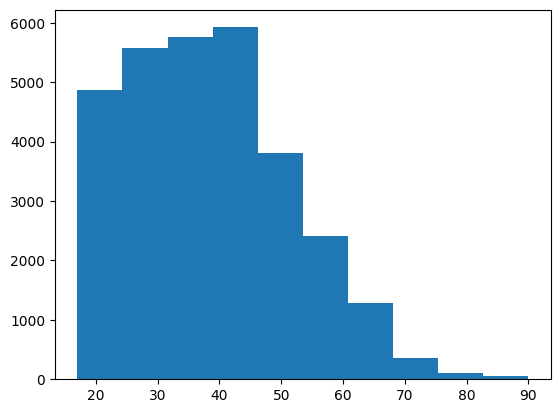

In [31]:
plt.hist(Data2['age'])

<Axes: xlabel='age', ylabel='educationno'>

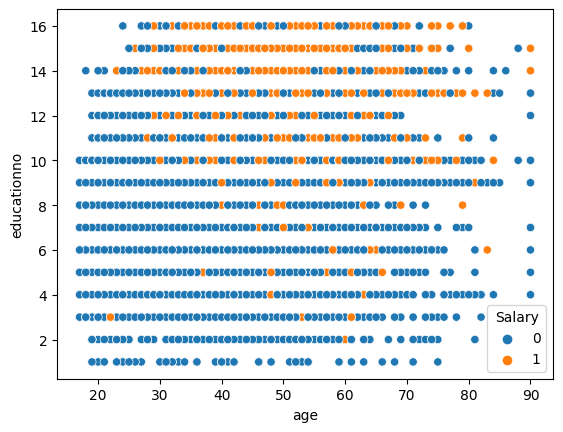

In [32]:
sns.scatterplot(x='age',y='educationno',data=Data2,hue='Salary')

<Axes: xlabel='workclass', ylabel='count'>

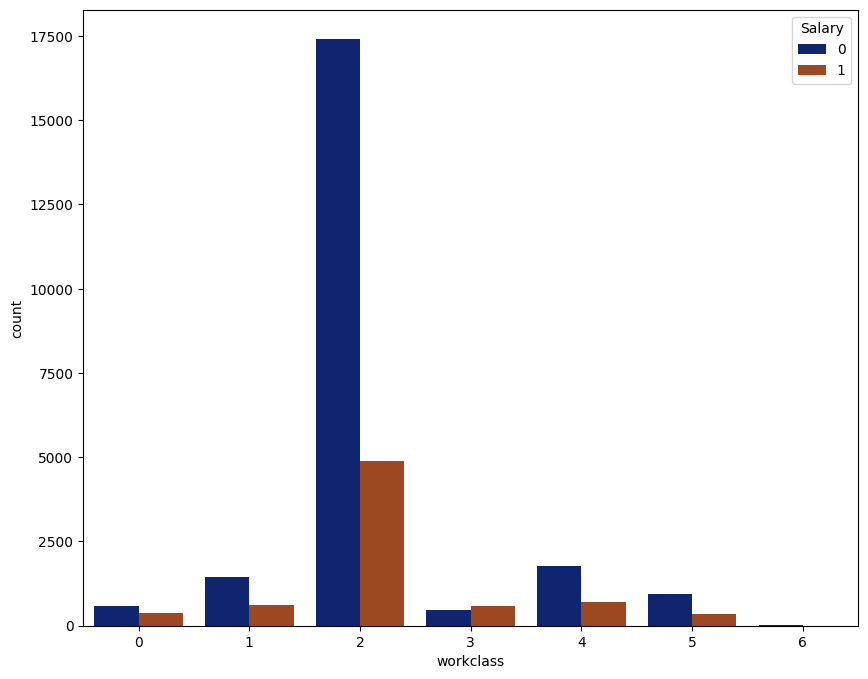

In [33]:
plt.figure(figsize=(10,8))
sns.countplot(x='workclass',hue='Salary',data=Data2,palette='dark')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13')])

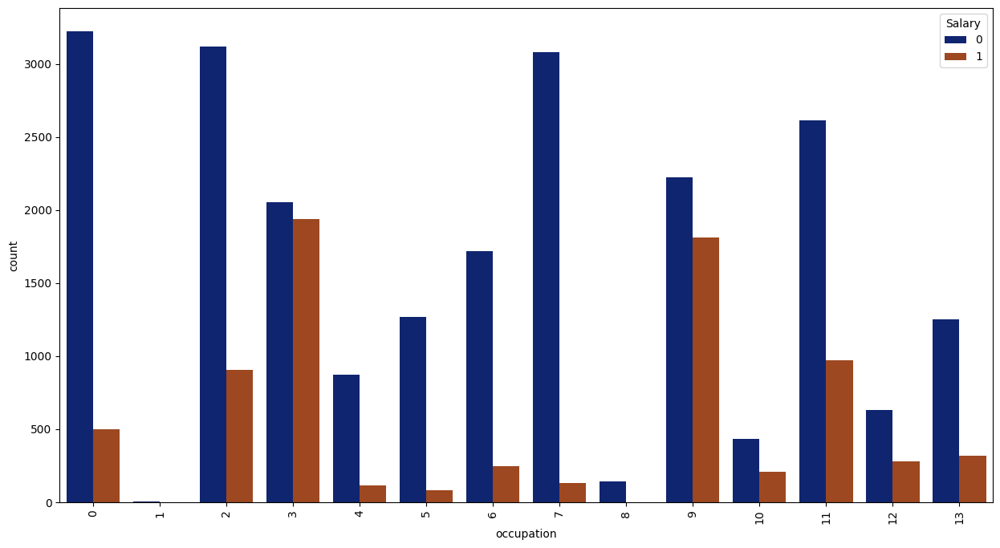

In [34]:
plt.figure(figsize=(15,8))
sns.countplot(x='occupation',hue='Salary',data=Data2,palette='dark')
plt.xticks( rotation ='vertical')

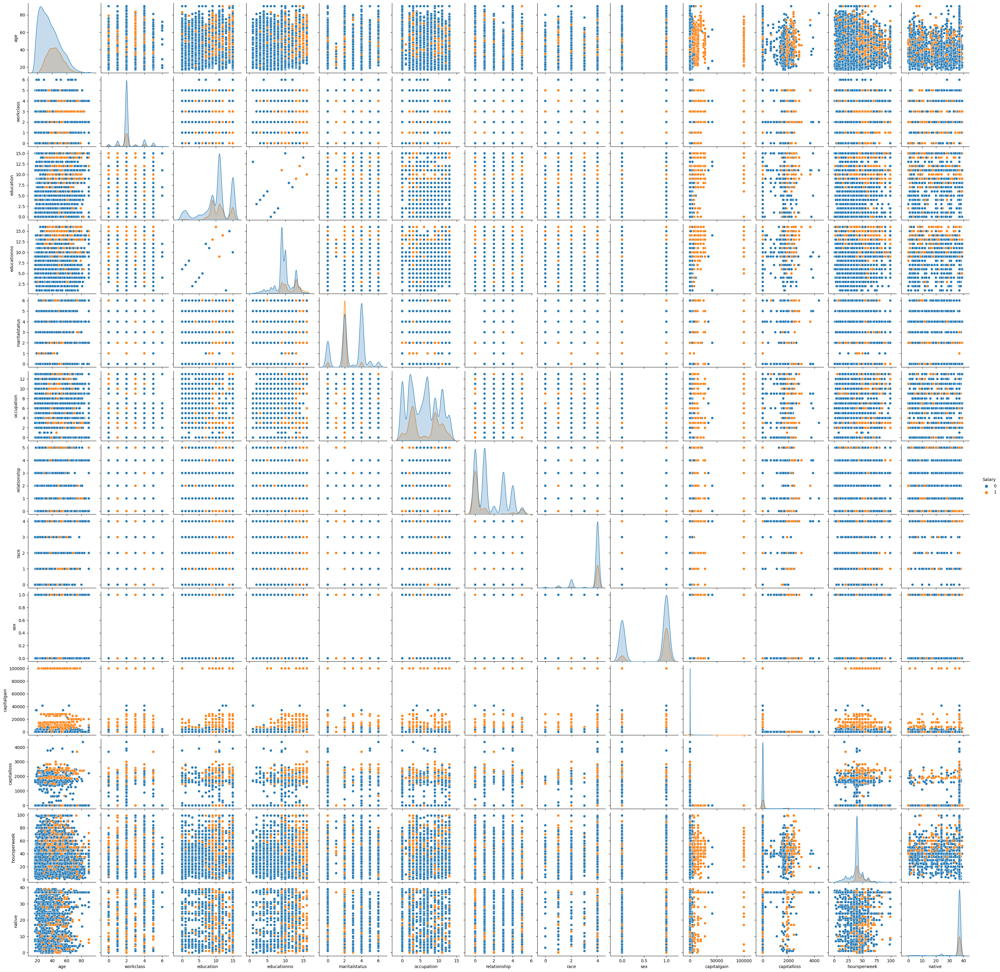

In [35]:
sns.pairplot(Data2,hue="Salary")

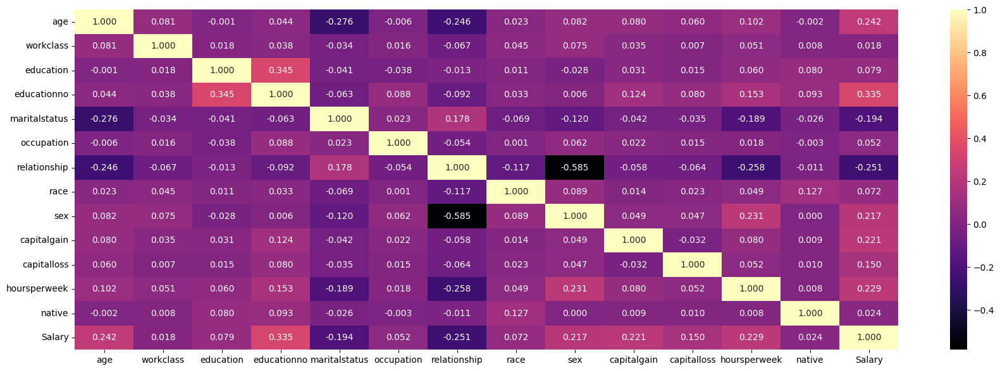

In [36]:
plt.figure(figsize = (21, 7));
sns.heatmap(Data2.corr(), cmap='magma', annot=True, fmt=".3f")
plt.show()

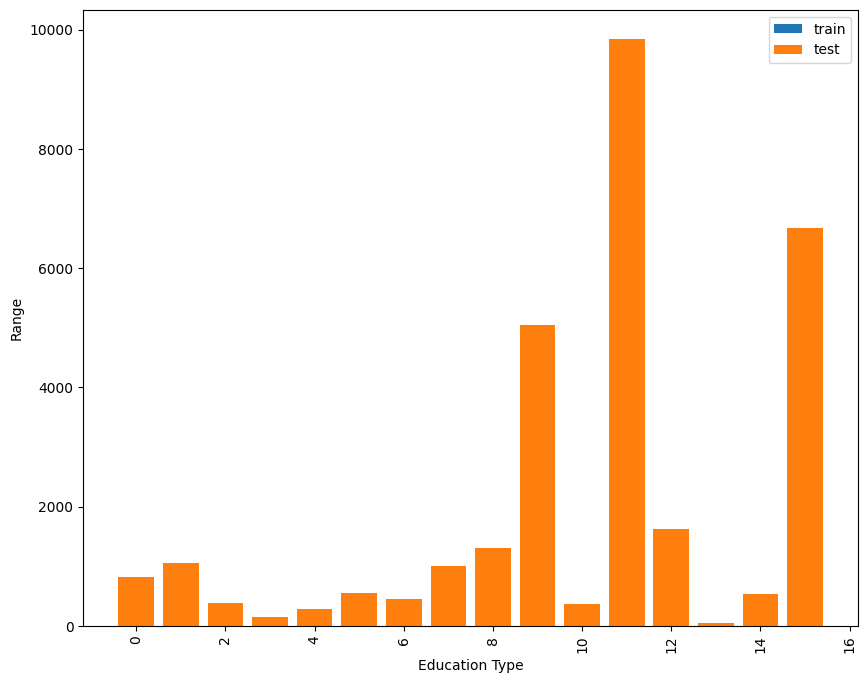

In [37]:
plt.figure(figsize=(10,8))
plt.bar(Data1['education'].value_counts().index,Data1['education'].value_counts(),data=Data1,joinstyle='round',label='train')
plt.bar(Data2['education'].value_counts().index,Data2['education'].value_counts(),data=Data2,joinstyle='round',label='test')
plt.xlabel('Education Type')
plt.ylabel('Range')
plt.xticks( rotation ='vertical')
plt.legend()

# Train Test Split

In [38]:
xtrain = Data1.iloc[:,0:13]
ytrain = Data1.iloc[:,-1]

In [39]:
xtest = Data2.iloc[:,0:13]
ytest = Data2.iloc[:,-1]

In [40]:
xtrain.shape, ytrain.shape, xtest.shape, ytest.shape

((15060, 13), (15060,), (30161, 13), (30161,))

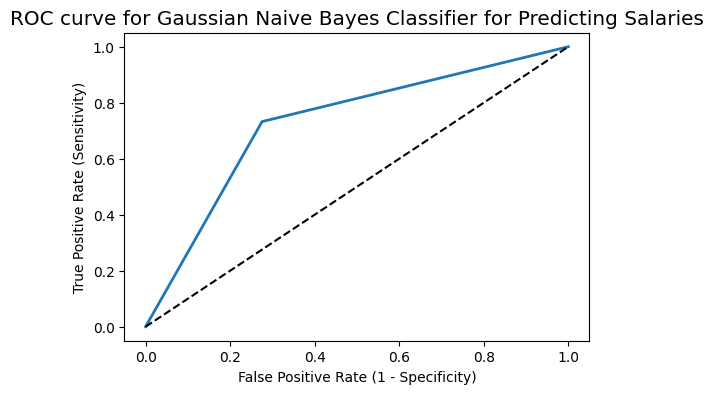

In [52]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve (ytest, y_pred, pos_label = 1)

plt.figure(figsize=(6,4))

plt.plot(fpr, tpr, linewidth=2)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12

plt.title('ROC curve for Gaussian Naive Bayes Classifier for Predicting Salaries')

plt.xlabel('False Positive Rate (1 - Specificity)')

plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

# Naive Bayes Classification

#  MultinomialNB

In [44]:
nb = MultinomialNB()
nb.fit(xtrain,ytrain)
ypred = nb.predict(xtest)

In [45]:
print(nb.score(xtrain,ytrain))
print(nb.score(xtest,ytest))
print(classification_report(ytest,ypred))

0.7749667994687915
0.7729186698053778
              precision    recall  f1-score   support

           0       0.79      0.96      0.86     22653
           1       0.63      0.21      0.32      7508

    accuracy                           0.77     30161
   macro avg       0.71      0.59      0.59     30161
weighted avg       0.75      0.77      0.73     30161



# GaussianNB

In [46]:
GB = GaussianNB()
GB.fit(xtrain,ytrain)
ypred = GB.predict(xtest)

In [47]:
print(GB.score(xtrain,ytrain))
print(GB.score(xtest,ytest))
print(classification_report(ytest,ypred))

0.7942231075697211
0.7943370577898611
              precision    recall  f1-score   support

           0       0.81      0.95      0.87     22653
           1       0.68      0.32      0.44      7508

    accuracy                           0.79     30161
   macro avg       0.75      0.64      0.66     30161
weighted avg       0.78      0.79      0.77     30161



BernoulliNB

In [48]:
BNB=BernoulliNB()
BNB.fit(xtrain,ytrain)

BernoulliNB()

In [49]:
y_pred = BNB.predict(xtest)
y_pred

array([0, 1, 0, ..., 0, 0, 0])

In [50]:
print(BNB.score(xtrain,ytrain))
print(BNB.score(xtest,ytest))

0.7296148738379814
0.7264347999071649


In [51]:
print(classification_report(y_pred,ytest))

              precision    recall  f1-score   support

           0       0.72      0.89      0.80     18418
           1       0.73      0.47      0.57     11743

    accuracy                           0.73     30161
   macro avg       0.73      0.68      0.69     30161
weighted avg       0.73      0.73      0.71     30161



Conclusion:
In this multinomial Naive Bayes, Gaussian Naive Bayes, Bernoulli Naive bayes models were used to preduct wheather the person makes over 50K a year. The Gaussian model yields a very good performance as indicated by the model accuracy which was found to be around 79 %